In [2]:
import osmnx as ox
import networkx as nx
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import random
import pandas as pd
from shapely.geometry import LineString, Point
import matplotlib.cm as cm
import matplotlib.colors as colors

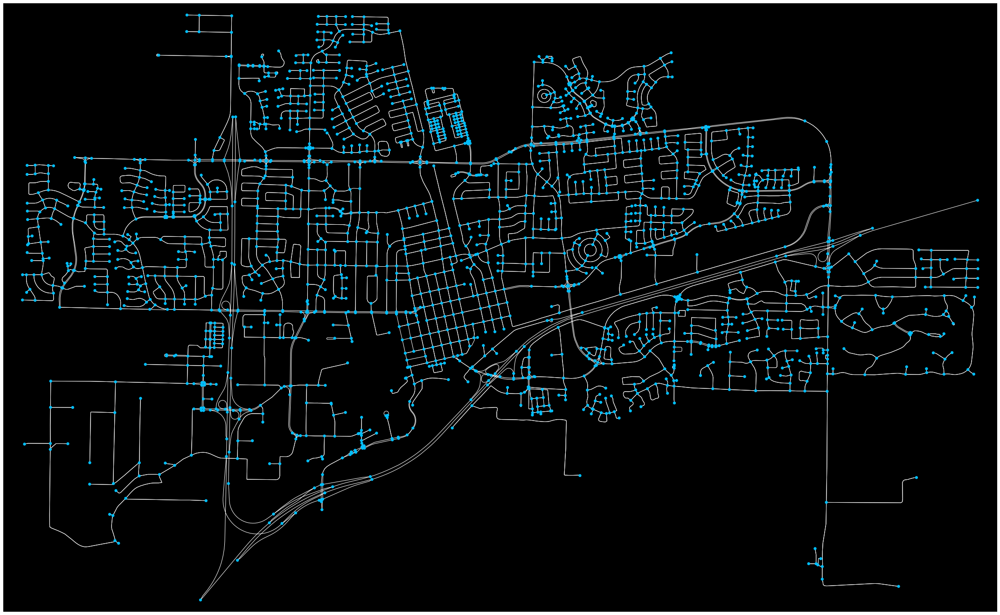

In [3]:
plt.ioff()
# get a graph for a city

# Set boundaries
north, south, east, west = 38.5754, 38.5156, -121.6759, -121.7941

#rf = '["highway"~"motorway|motorway_link|primary|primary_link|secondary|secondary_link|tertiary|tertiary_link"]'

# load entire graph
G = ox.graph_from_bbox(north, south, east, west, network_type='drive')


# Plot a map
fig, ax = ox.plot_graph(G, figsize=(40, 24), node_color='deepskyblue',
                        node_size=40, edge_linewidth=1,edge_color='white', show=False, close=False, bgcolor='black')

plt.show()
plt.close('all')

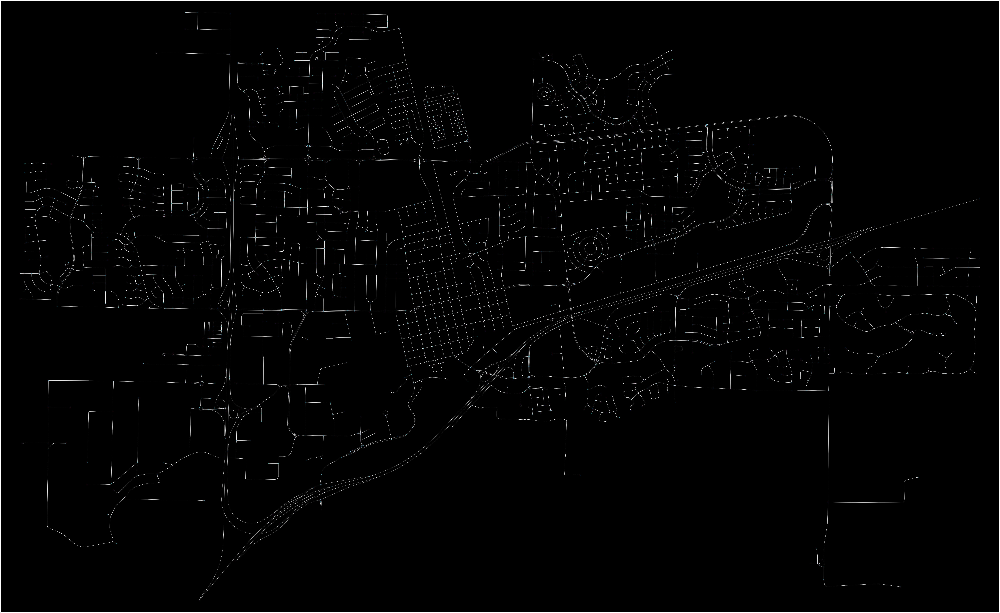

In [108]:
# Plot a high-resolution map
fig, ax = ox.plot_graph(G, figsize=(160, 96), node_color='deepskyblue',
                        node_size=10, edge_linewidth=1,edge_color='white', show=False, close=False, bgcolor='black')

plt.show()
plt.close('all')

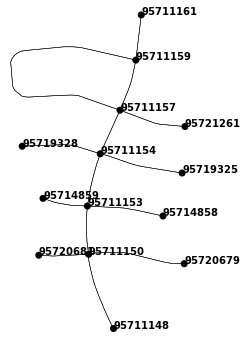

In [316]:
# Set boundaries
north, south, east, west = 38.560306, 38.554962, -121.778196, -121.782457

# load entire graph
G2 = ox.graph_from_bbox(north, south, east, west, network_type='drive')
G2.remove_edge(256194000, 95711161)
G2.remove_edge(95711161, 256194000)

fig, ax = ox.plot_graph(G2, figsize=(10, 6), node_color='k', node_size=50, edge_linewidth=0.5,edge_color='black', show=False, close=False, bgcolor='white')

for node in G2.nodes:
    #if node % 10 == 4 :#or node % 10 == 4:
        coord = ( G2.nodes[node]['x'], G2.nodes[node]['y'] )
        ax.annotate(node, xy=coord, color='black', weight='bold', size = 10)

plt.show()
plt.close('all')

In [261]:
G2.nodes[95721261]

{'y': 38.5582677,
 'x': -121.7785476,
 'highway': 'turning_circle',
 'street_count': 1}

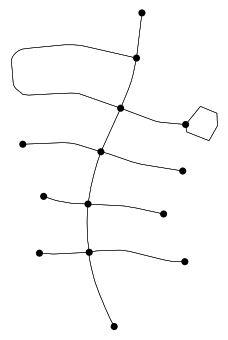

In [318]:
coords = [
    (-121.7785476, 38.5582677),
    (-121.7782631, 38.5585401),
    (-121.7779461, 38.5584381),
    (-121.7779381, 38.5582461),
    (-121.7780981, 38.5580251),
    (-121.7785271, 38.5581571),
    (-121.7785476, 38.5582677)
]


geometry =  LineString(
    [Point((x,y)) for (x,y) in coords]
)

new_edge_dat = {
    'osmid': 10745321,
    'name': 'self loop',
    'highway': 'residential',
    'oneway': False,
    'length': 50,
    'geometry': geometry
}

G2.add_edges_from([(95721261, 95721261, new_edge_dat)])

fig, ax = ox.plot_graph(G2, figsize=(10, 6), node_color='k', node_size=50,
                        edge_linewidth=0.5,edge_color='black', show=False, close=False, bgcolor='white')

plt.show()
plt.close('all')

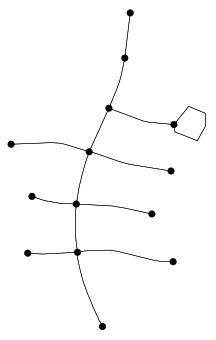

In [319]:
#multi-edges
G2.remove_edge(95711159, 95711157, 1)
G2.remove_edge(95711157, 95711159, 1)

fig, ax = ox.plot_graph(G2, figsize=(10, 6), node_color='k', node_size=50, edge_linewidth=0.5,edge_color='black', show=False, close=False, bgcolor='white')

plt.show()
plt.close('all')

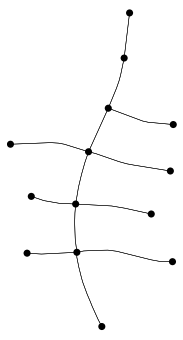

In [320]:
#selfloops
G2.remove_edge(95721261, 95721261, 0)
G2.remove_edge(95721261, 95721261, 1)

fig, ax = ox.plot_graph(G2, figsize=(10, 6), node_color='k', node_size=50, edge_linewidth=0.5,edge_color='black', show=False, close=False, bgcolor='white')

plt.show()
plt.close('all')

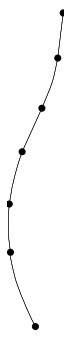

In [223]:
#multi-edges
G2.remove_edge(95711159, 95711157, 1)
G2.remove_edge(95711157, 95711159, 1)

#dead-ends
G2.remove_edge(95711157, 95721261, 0)
G2.remove_edge(95721261, 95711157, 0)

G2.remove_edge(95711154, 95719328, 0)
G2.remove_edge(95719328, 95711154, 0)

G2.remove_edge(95711154, 95719325, 0)
G2.remove_edge(95719325, 95711154, 0)

G2.remove_edge(95711153, 95714859, 0)
G2.remove_edge(95714859, 95711153, 0)

G2.remove_edge(95711153, 95714858, 0)
G2.remove_edge(95714858, 95711153, 0)

G2.remove_edge(95711150, 95720681, 0)
G2.remove_edge(95720681, 95711150, 0)

G2.remove_edge(95711150, 95720679, 0)
G2.remove_edge(95720679, 95711150, 0)

fig, ax = ox.plot_graph(G2, figsize=(10, 6), node_color='k', node_size=50, edge_linewidth=0.5,edge_color='black', show=False, close=False, bgcolor='white')

plt.show()
plt.close('all')

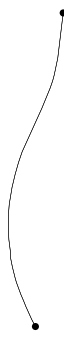

In [228]:
G = G2

attrs_to_sum = {"length", "travel_time"}

## Edge contraction ##
all_nodes_to_remove = []
all_edges_to_add = []

# generate each path that needs to be simplified
for path in ox.simplification._get_paths_to_simplify(G, strict=True):

    # add the interstitial edges we're removing to a list so we can retain
    # their spatial geometry
    path_attributes = dict()
    edges_in_path = []

    for u, v in zip(path[:-1], path[1:]):

        # get edge between these nodes: if multiple edges exist between
        # them (see above), we retain only one in the simplified graph
        edge_data = G.edges[u, v, 0]                
        edges_in_path.append((u,v,0))

        for attr in edge_data:
            if attr in path_attributes:
                # if this key already exists in the dict, append it to the
                # value list
                dat_val = edge_data[attr]
                if type(dat_val) == list:
                    path_attributes[attr] = path_attributes[attr] + edge_data[attr]
                else:
                    path_attributes[attr].append(edge_data[attr])
            else:
                # if this key doesn't already exist, set the value to a list
                # containing the one value
                dat_val = edge_data[attr]
                if type(dat_val) == list:
                    path_attributes[attr] = edge_data[attr]
                else:
                    path_attributes[attr] = [edge_data[attr]]

    # consolidate the path's edge segments' attribute values
    for attr in path_attributes:
        if attr in attrs_to_sum:
            # if this attribute must be summed, sum it now
            path_attributes[attr] = sum(path_attributes[attr])
        elif (attr != "geometry") and len(set(path_attributes[attr])) == 1:
            # if there's only 1 unique value in this attribute list,
            # consolidate it to the single value (the zero-th):
            path_attributes[attr] = path_attributes[attr][0]
        elif attr != "geometry":
            # otherwise, if there are multiple values, keep one of each
            path_attributes[attr] = list(set(path_attributes[attr]))

    # Check consolidated edges are all in the 'consolidated_edges'
    if 'consolidated_edges' not in path_attributes:
        # none of the edges in path is previously consolidated
        # all the exact edges in the path is added to 'consolidated edges'
        path_attributes['consolidated_edges'] = edges_in_path
    else:
        # at least one of the edges in path is previously consolidated
        # previously not consolidated edges need to be added to 'consolidated edges'
        for edge in edges_in_path:
            if edge in input_G.edges:
                path_attributes['consolidated_edges'].append(edge)

    # construct the new consolidated edge's geometry for this path
    if 'geometry' not in path_attributes:
        path_attributes["geometry"] = LineString(
            [Point((G.nodes[node]["x"], G.nodes[node]["y"])) for node in path]
        )
    else:
        points = []
        geometry = path_attributes['geometry']

        # Gather geometry dataframes in a list
        gm_df = []
        for gm in geometry:
            x,y = gm.coords.xy
            df = pd.DataFrame({'x':x,'y':y})
            gm_df.append(df)

        for node in path:
            node_x = G.nodes[node]['x']
            node_y = G.nodes[node]['y']
            node_coord = (node_x, node_y)
            node_point = Point(node_coord)
            #if node_point in points: continue

            used_df_idx = [] # Prevent using duplicate geometry in reverse=order
            node_belong_to_gm = False

            for i, df in enumerate(gm_df):
                # check if this node has geometry
                has_gm = ((df['x'] == node_x) & (df['y'] == node_y))

                # if geometry exists, add all the points in it
                if has_gm.loc[has_gm.index[0]] and i not in used_df_idx:
                    node_belong_to_gm = True
                    used_df_idx.append(i)
                    for idx, row in df.iterrows():
                        x_coord = row['x']
                        y_coord = row['y']
                        geo_point = Point((x_coord, y_coord))
                        if geo_point not in points: points.append(geo_point)
                elif has_gm.loc[has_gm.index[-1]] and i not in used_df_idx:
                    node_belong_to_gm = True
                    used_df_idx.append(i)
                    df = df[::-1]
                    for idx, row in df.iterrows():
                        x_coord = row['x']
                        y_coord = row['y']
                        geo_point = Point((x_coord, y_coord))
                        if geo_point not in points: points.append(geo_point)

            # for node without geometry, simply add its single point
            if not node_belong_to_gm:
                points.append(node_point)

        path_attributes["geometry"] = LineString(points)

    # add the nodes and edge to their lists for processing at the end
    all_nodes_to_remove.extend(path[1:-1])
    all_edges_to_add.append(
        {"origin": path[0], "destination": path[-1], "attr_dict": path_attributes}
    )

# for each edge to add in the list we assembled, create a new edge between
# the origin and destination
for edge in all_edges_to_add:
    G.add_edge(edge["origin"], edge["destination"], **edge["attr_dict"])

# finally remove all the interstitial nodes between the new edges
G.remove_nodes_from(set(all_nodes_to_remove))

fig, ax = ox.plot_graph(G, figsize=(10, 6), node_color='k', node_size=50, edge_linewidth=0.5,edge_color='black', show=False, close=False, bgcolor='white')

plt.show()
plt.close('all')

In [191]:
road_priority = {
    'motorway': 0,
    'primary': 1,
    'secondary': 2,
    'tertiary': 3,
    'residential': 4,
    'motorway_link': 5,
    'primary_link': 6,
    'secondary_link': 7,
    'tertiary_link': 8,
    'unclassified': 9
}

for edge in G.edges:

    edge_type = G.edges[edge]['highway']

    if type(edge_type) is list:
        sorted_type = sorted(edge_type, reverse=False, key = lambda d: road_priority[d])
        edge_type = sorted_type[0]
        G.edges[edge]['highway'] = edge_type

In [3]:
# Show the basic statistics of the map
ox.basic_stats(G)

{'n': 2164,
 'm': 5108,
 'k_avg': 4.720887245841035,
 'edge_length_total': 696378.2239999997,
 'edge_length_avg': 136.33089741581827,
 'streets_per_node_avg': 2.6880776340110906,
 'streets_per_node_counts': {0: 0, 1: 531, 2: 21, 3: 1221, 4: 378, 5: 9, 6: 4},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.2453789279112754,
  2: 0.009704251386321626,
  3: 0.5642329020332717,
  4: 0.17467652495378927,
  5: 0.004158964879852125,
  6: 0.0018484288354898336},
 'intersection_count': 1633,
 'street_length_total': 403874.6329999999,
 'street_segment_count': 2914,
 'street_length_avg': 138.5980209334248,
 'circuity_avg': 1.0908265909050636,
 'self_loop_proportion': 0.005833905284831846}

In [39]:
def simplify(input_G):
    # define edge segment attributes to sum upon edge simplification
    attrs_to_sum = {"length", "travel_time"}
    
    # keep track of removed edges
    removed_edges = []
    
    acc_multi_edges = []
    acc_selfloops = []
    acc_dead_ends = []

    # make a copy to not mutate original graph object caller passed in
    G = input_G.copy()
     
    not_converged = True
    
    node_num = G.number_of_nodes()
    edge_num = G.number_of_edges()
    G_stat = (node_num, edge_num)
    
    cnt = 0
    
    print('Initial stat (nodes, edges):', G_stat)
           
    while not_converged:
        
        # keep track of removed edges in this iteration
        removed_edges_per_iteration = []
        
        ## Remove multi-edges ##
        multi_edges = []
        multi_edge_removed_pair = set()
        
        for u,v,k,d in G.edges(data=True, keys=True):
            if (u,v) not in multi_edge_removed_pair:
                all_edges_btwn_nodes = list(G.get_edge_data(u,v).items())
                edge_dat_sorted_by_length = sorted(all_edges_btwn_nodes, reverse=False, key= lambda d: d[1]['length'])
                shortest_edge_key = edge_dat_sorted_by_length[0][0]
                multi_edge_removed_pair.add((u,v))
                
                for key, data in G.get_edge_data(u,v).items():
                    if key != shortest_edge_key:
                        multi_edges.append((u, v, key))
        
        # Record which edge chunks are going to be removed at this iteration
        for edge in multi_edges:
            if 'consolidated_edges' in G.edges[edge]:
                cons_edges = G.edges[edge]['consolidated_edges']
                removed_edges_per_iteration = removed_edges_per_iteration + cons_edges
                ### test purpose
                acc_multi_edges = acc_multi_edges + cons_edges
            else:
                removed_edges_per_iteration.append(edge)
                ### test purpose
                acc_multi_edges.append(edge)
                    
        # remove all the edges whose key is not 0
        G.remove_edges_from(multi_edges)

        ## Remove selfloops ##
        selfloops = list(nx.selfloop_edges(G, keys=True))
        
        for edge in selfloops:               
            if 'consolidated_edges' in G.edges[edge]:
                cons_edges = G.edges[edge]['consolidated_edges']
                removed_edges_per_iteration = removed_edges_per_iteration + cons_edges
                ### test purpose
                acc_selfloops = acc_selfloops + cons_edges
            else:
                removed_edges_per_iteration.append(edge)
                ### test purpose
                acc_selfloops.append(edge)

        G.remove_edges_from(selfloops)
        
    
        ## Remove dead-ends ##
        for _ in range(0,20):
            dead_ends = []
            
            st_cnt = ox.utils_graph.count_streets_per_node(G, nodes=None)
            nx.set_node_attributes(G, st_cnt, 'street_count')

            rm = []

            for node in G.nodes:
                if G.nodes[node]['street_count'] == 1:
                    rm.append(node)
                    dead_ends = dead_ends + list(G.in_edges(node, keys=True)) + list(G.out_edges(node, keys=True))
                    
            dead_ends = list(set(dead_ends))
            
            for edge in dead_ends:
                if 'consolidated_edges' in G.edges[edge]:
                    cons_edges = G.edges[edge]['consolidated_edges']
                    removed_edges_per_iteration = removed_edges_per_iteration + cons_edges
                    ### test purpose
                    acc_dead_ends = acc_dead_ends + cons_edges
                else:
                    removed_edges_per_iteration.append(edge)
                    ### test purpose
                    acc_dead_ends.append(edge)
            
            G.remove_nodes_from(rm)
            
        ## Edge contraction ##
        all_nodes_to_remove = []
        all_edges_to_add = []
        
        # generate each path that needs to be simplified
        for path in ox.simplification._get_paths_to_simplify(G, strict=True):

            # add the interstitial edges we're removing to a list so we can retain
            # their spatial geometry
            path_attributes = dict()
            edges_in_path = []
            
            for u, v in zip(path[:-1], path[1:]):
                
                # get edge between these nodes. Multi-edges do not exist since already removed
                edge_key_and_data = tuple(G.get_edge_data(u, v).items())[0]
                edge_key = edge_key_and_data[0]
                exact_edge = (u,v, edge_key)
                edge_data = edge_key_and_data[1]
                edges_in_path.append(exact_edge)
                
                for attr in edge_data:
                    if attr in path_attributes:
                        # if this key already exists in the dict, append it to the
                        # value list
                        dat_val = edge_data[attr]
                        if type(dat_val) == list:
                            path_attributes[attr] = path_attributes[attr] + edge_data[attr]
                        else:
                            path_attributes[attr].append(edge_data[attr])
                    else:
                        # if this key doesn't already exist, set the value to a list
                        # containing the one value
                        dat_val = edge_data[attr]
                        if type(dat_val) == list:
                            path_attributes[attr] = edge_data[attr]
                        else:
                            path_attributes[attr] = [edge_data[attr]]
                
            # consolidate the path's edge segments' attribute values
            for attr in path_attributes:
                if attr in attrs_to_sum:
                    # if this attribute must be summed, sum it now
                    path_attributes[attr] = sum(path_attributes[attr])
                elif (attr != "geometry") and len(set(path_attributes[attr])) == 1:
                    # if there's only 1 unique value in this attribute list,
                    # consolidate it to the single value (the zero-th):
                    path_attributes[attr] = path_attributes[attr][0]
                elif attr != "geometry":
                    # otherwise, if there are multiple values, keep one of each
                    path_attributes[attr] = list(set(path_attributes[attr]))
            
            # Check consolidated edges are all in the 'consolidated_edges'
            if 'consolidated_edges' not in path_attributes:
                # none of the edges in path is previously consolidated
                # all the exact edges in the path is added to 'consolidated edges'
                path_attributes['consolidated_edges'] = edges_in_path
            else:
                # at least one of the edges in path is previously consolidated
                # previously not consolidated edges need to be added to 'consolidated edges'
                for edge in edges_in_path:
                    if edge in input_G.edges:
                        path_attributes['consolidated_edges'].append(edge)
                                               
            # construct the new consolidated edge's geometry for this path
            if 'geometry' not in path_attributes:
                path_attributes["geometry"] = LineString(
                    [Point((G.nodes[node]["x"], G.nodes[node]["y"])) for node in path]
                )
            else:
                points = []
                geometry = path_attributes['geometry']

                # Gather geometry dataframes in a list
                gm_df = []
                for gm in geometry:
                    x,y = gm.coords.xy
                    df = pd.DataFrame({'x':x,'y':y})
                    gm_df.append(df)

                for node in path:
                    node_x = G.nodes[node]['x']
                    node_y = G.nodes[node]['y']
                    node_coord = (node_x, node_y)
                    node_point = Point(node_coord)
                    #if node_point in points: continue

                    used_df_idx = [] # Prevent using duplicate geometry in reverse=order
                    node_belong_to_gm = False

                    for i, df in enumerate(gm_df):
                        # check if this node has geometry
                        has_gm = ((df['x'] == node_x) & (df['y'] == node_y))

                        # if geometry exists, add all the points in it
                        if has_gm.loc[has_gm.index[0]] and i not in used_df_idx:
                            node_belong_to_gm = True
                            used_df_idx.append(i)
                            for idx, row in df.iterrows():
                                x_coord = row['x']
                                y_coord = row['y']
                                geo_point = Point((x_coord, y_coord))
                                if geo_point not in points: points.append(geo_point)
                        elif has_gm.loc[has_gm.index[-1]] and i not in used_df_idx:
                            node_belong_to_gm = True
                            used_df_idx.append(i)
                            df = df[::-1]
                            for idx, row in df.iterrows():
                                x_coord = row['x']
                                y_coord = row['y']
                                geo_point = Point((x_coord, y_coord))
                                if geo_point not in points: points.append(geo_point)

                    # for node without geometry, simply add its single point
                    if not node_belong_to_gm:
                        points.append(node_point)

                path_attributes["geometry"] = LineString(points)

            # add the nodes and edge to their lists for processing at the end
            all_nodes_to_remove.extend(path[1:-1])
            all_edges_to_add.append(
                {"origin": path[0], "destination": path[-1], "attr_dict": path_attributes}
            )

        # for each edge to add in the list we assembled, create a new edge between
        # the origin and destination
        for edge in all_edges_to_add:
            G.add_edge(edge["origin"], edge["destination"], **edge["attr_dict"])

        # finally remove all the interstitial nodes between the new edges
        G.remove_nodes_from(set(all_nodes_to_remove))
        
        # check convergence
        current_node_num = G.number_of_nodes()
        current_edge_num = G.number_of_edges()
        current_stat = (current_node_num, current_edge_num)
        
        if G_stat == current_stat:
            not_converged = False
            break
        else:           
            G_stat = current_stat
            removed_edges.append(removed_edges_per_iteration)
            cnt += 1
        
        print('Stat at iteration', cnt, '(nodes, edges):', G_stat)
            
    print('Graph converged at iteration', cnt)
        
    return G, removed_edges, (acc_multi_edges, acc_selfloops, acc_dead_ends)

In [13]:
### In modification ###

def simplify(input_G):
    # define edge segment attributes to sum upon edge simplification
    attrs_to_sum = {"length", "travel_time"}
    
    # keep track of removed edges
    removed_edges = []
    
    acc_multi_edges = []
    acc_selfloops = []
    acc_dead_ends = []

    # make a copy to not mutate original graph object caller passed in
    G = input_G.copy()
     
    not_converged = True
    
    node_num = G.number_of_nodes()
    edge_num = G.number_of_edges()
    G_stat = (node_num, edge_num)
    
    cnt = 0
    
    print('Initial stat (nodes, edges):', G_stat)
    
    nx.set_node_attributes(G, 1, 'aggr_node_num')
           
    while not_converged:
        
        # keep track of removed edges in this iteration
        removed_edges_per_iteration = []
        
        ## Remove multi-edges ##
        multi_edges = []
        multi_edge_removed_pair = set()
        
        for u,v,k,d in G.edges(data=True, keys=True):
            if (u,v) not in multi_edge_removed_pair:
                all_edges_btwn_nodes = list(G.get_edge_data(u,v).items())
                edge_dat_sorted_by_length = sorted(all_edges_btwn_nodes, reverse=False, key= lambda d: d[1]['length'])
                shortest_edge_key = edge_dat_sorted_by_length[0][0]
                multi_edge_removed_pair.add((u,v))
                
                for key, data in G.get_edge_data(u,v).items():
                    if key != shortest_edge_key:
                        multi_edges.append((u, v, key))
        
        # Record which edge chunks are going to be removed at this iteration
        for edge in multi_edges:
            if 'consolidated_edges' in G.edges[edge]:
                cons_edges = G.edges[edge]['consolidated_edges']
                removed_edges_per_iteration = removed_edges_per_iteration + cons_edges
                ### test purpose
                acc_multi_edges = acc_multi_edges + cons_edges
            else:
                removed_edges_per_iteration.append(edge)
                ### test purpose
                acc_multi_edges.append(edge)
                    
        # remove all the edges whose key is not 0
        G.remove_edges_from(multi_edges)

        ## Remove selfloops ##
        selfloops = list(nx.selfloop_edges(G, keys=True))
        
        for edge in selfloops:               
            if 'consolidated_edges' in G.edges[edge]:
                cons_edges = G.edges[edge]['consolidated_edges']
                removed_edges_per_iteration = removed_edges_per_iteration + cons_edges
                ### test purpose
                acc_selfloops = acc_selfloops + cons_edges
            else:
                removed_edges_per_iteration.append(edge)
                ### test purpose
                acc_selfloops.append(edge)

        G.remove_edges_from(selfloops)
        
    
        ## Remove dead-ends ##
        for _ in range(0,20):
            dead_ends = []
            
            st_cnt = ox.utils_graph.count_streets_per_node(G, nodes=None)
            nx.set_node_attributes(G, st_cnt, 'street_count')

            rm = []

            for node in G.nodes:
                if G.nodes[node]['street_count'] == 1:
                    rm.append(node)
                    dead_ends = dead_ends + list(G.in_edges(node, keys=True)) + list(G.out_edges(node, keys=True))
                    
            dead_ends = list(set(dead_ends))
            
            for edge in dead_ends:
                if 'consolidated_edges' in G.edges[edge]:
                    cons_edges = G.edges[edge]['consolidated_edges']
                    removed_edges_per_iteration = removed_edges_per_iteration + cons_edges
                    ### test purpose
                    acc_dead_ends = acc_dead_ends + cons_edges
                else:
                    removed_edges_per_iteration.append(edge)
                    ### test purpose
                    acc_dead_ends.append(edge)
            
            # Add the number of aggregated nodes to its the only neighbor
            for node in rm:
                aggr_node_num = G.nodes[node]['aggr_node_num']
                print(list(G.neighbors(node)))
                neighbor_node = list(G.neighbors(node))[0]
                
                G.nodes[neighbor_node]['aggr_node_num'] += aggr_node_num
            
            G.remove_nodes_from(rm)
            
        ## Edge contraction ##
        all_nodes_to_remove = []
        all_edges_to_add = []
        
        # generate each path that needs to be simplified
        for path in ox.simplification._get_paths_to_simplify(G, strict=True):

            # add the interstitial edges we're removing to a list so we can retain
            # their spatial geometry
            path_attributes = dict()
            edges_in_path = []
            
            acc_aggr_node_num = 0
            start_node = path[0]
            end_node = path[-1]
            
            for idx, node in enumerate(path):
                if node != start_node and node != end_node:
                    node_aggr_node_num = G.nodes[node]['aggr_node_num']
                    acc_aggr_node_num += node_aggr_node_num
            
            G.nodes[start_node]['aggr_node_num'] += acc_aggr_node_num / 2
            G.nodes[end_node]['aggr_node_num'] += acc_aggr_node_num / 2
            
            for u, v in zip(path[:-1], path[1:]):
                
                # get edge between these nodes. Multi-edges do not exist since already removed
                edge_key_and_data = tuple(G.get_edge_data(u, v).items())[0]
                edge_key = edge_key_and_data[0]
                exact_edge = (u,v, edge_key)
                edge_data = edge_key_and_data[1]
                edges_in_path.append(exact_edge)
                
                for attr in edge_data:
                    if attr in path_attributes:
                        # if this key already exists in the dict, append it to the
                        # value list
                        dat_val = edge_data[attr]
                        if type(dat_val) == list:
                            path_attributes[attr] = path_attributes[attr] + edge_data[attr]
                        else:
                            path_attributes[attr].append(edge_data[attr])
                    else:
                        # if this key doesn't already exist, set the value to a list
                        # containing the one value
                        dat_val = edge_data[attr]
                        if type(dat_val) == list:
                            path_attributes[attr] = edge_data[attr]
                        else:
                            path_attributes[attr] = [edge_data[attr]]
                
            # consolidate the path's edge segments' attribute values
            for attr in path_attributes:
                if attr in attrs_to_sum:
                    # if this attribute must be summed, sum it now
                    path_attributes[attr] = sum(path_attributes[attr])
                elif (attr != "geometry") and len(set(path_attributes[attr])) == 1:
                    # if there's only 1 unique value in this attribute list,
                    # consolidate it to the single value (the zero-th):
                    path_attributes[attr] = path_attributes[attr][0]
                elif attr != "geometry":
                    # otherwise, if there are multiple values, keep one of each
                    path_attributes[attr] = list(set(path_attributes[attr]))
            
            # Check consolidated edges are all in the 'consolidated_edges'
            if 'consolidated_edges' not in path_attributes:
                # none of the edges in path is previously consolidated
                # all the exact edges in the path is added to 'consolidated edges'
                path_attributes['consolidated_edges'] = edges_in_path
            else:
                # at least one of the edges in path is previously consolidated
                # previously not consolidated edges need to be added to 'consolidated edges'
                for edge in edges_in_path:
                    if edge in input_G.edges:
                        path_attributes['consolidated_edges'].append(edge)
                                               
            # construct the new consolidated edge's geometry for this path
            if 'geometry' not in path_attributes:
                path_attributes["geometry"] = LineString(
                    [Point((G.nodes[node]["x"], G.nodes[node]["y"])) for node in path]
                )
            else:
                points = []
                geometry = path_attributes['geometry']

                # Gather geometry dataframes in a list
                gm_df = []
                for gm in geometry:
                    x,y = gm.coords.xy
                    df = pd.DataFrame({'x':x,'y':y})
                    gm_df.append(df)

                for node in path:
                    node_x = G.nodes[node]['x']
                    node_y = G.nodes[node]['y']
                    node_coord = (node_x, node_y)
                    node_point = Point(node_coord)
                    #if node_point in points: continue

                    used_df_idx = [] # Prevent using duplicate geometry in reverse=order
                    node_belong_to_gm = False

                    for i, df in enumerate(gm_df):
                        # check if this node has geometry
                        has_gm = ((df['x'] == node_x) & (df['y'] == node_y))

                        # if geometry exists, add all the points in it
                        if has_gm.loc[has_gm.index[0]] and i not in used_df_idx:
                            node_belong_to_gm = True
                            used_df_idx.append(i)
                            for idx, row in df.iterrows():
                                x_coord = row['x']
                                y_coord = row['y']
                                geo_point = Point((x_coord, y_coord))
                                if geo_point not in points: points.append(geo_point)
                        elif has_gm.loc[has_gm.index[-1]] and i not in used_df_idx:
                            node_belong_to_gm = True
                            used_df_idx.append(i)
                            df = df[::-1]
                            for idx, row in df.iterrows():
                                x_coord = row['x']
                                y_coord = row['y']
                                geo_point = Point((x_coord, y_coord))
                                if geo_point not in points: points.append(geo_point)

                    # for node without geometry, simply add its single point
                    if not node_belong_to_gm:
                        points.append(node_point)

                path_attributes["geometry"] = LineString(points)

            # add the nodes and edge to their lists for processing at the end
            all_nodes_to_remove.extend(path[1:-1])
            all_edges_to_add.append(
                {"origin": path[0], "destination": path[-1], "attr_dict": path_attributes}
            )

        # for each edge to add in the list we assembled, create a new edge between
        # the origin and destination
        for edge in all_edges_to_add:
            G.add_edge(edge["origin"], edge["destination"], **edge["attr_dict"])

        # finally remove all the interstitial nodes between the new edges
        G.remove_nodes_from(set(all_nodes_to_remove))
        
        # check convergence
        current_node_num = G.number_of_nodes()
        current_edge_num = G.number_of_edges()
        current_stat = (current_node_num, current_edge_num)
        
        if G_stat == current_stat:
            not_converged = False
            break
        else:           
            G_stat = current_stat
            removed_edges.append(removed_edges_per_iteration)
            cnt += 1
        
        print('Stat at iteration', cnt, '(nodes, edges):', G_stat)
            
    print('Graph converged at iteration', cnt)
        
    return G, removed_edges, (acc_multi_edges, acc_selfloops, acc_dead_ends)

In [14]:
G1, removed_edges, removed_cat = simplify(G)

# Plot a map
fig, ax = ox.plot_graph(G1, figsize=(40, 24), node_color='deepskyblue',
                        node_size=30, edge_linewidth=1,edge_color='white', show=False, close=False, bgcolor='black')

plt.show()
plt.close('all')

Initial stat (nodes, edges): (2164, 5108)
[62248795]
[62242470]
[62261862]
[62248795]
[591391499]
[62372556]
[62372611]
[95704011]
[95704644]
[95705104]
[95706247]
[1907567580]
[95708038]
[95707037]
[95708515]
[95708532]
[95708562]
[95708589]
[95708597]
[265024417]
[559694542]
[95708934]
[95708934]
[95709159]
[95709160]
[95709280]
[95709284]
[95709297]
[95709298]
[95709304]
[95709327]
[95709329]
[95709339]
[7509642757]
[95709721]
[95709731]
[95709857]
[95710158]
[95710231]
[95710234]
[95710245]
[95708532]
[95710389]
[95710414]
[95708812]
[1366304024]
[95710892]
[95710975]
[95703985]
[95711002]
[95711004]
[95711004]
[95711006]
[95711089]
[95708515]
[95711146]
[95710450]
[95711253]
[95711258]
[95711275]
[95711377]
[95711489]
[95711589]
[95711671]
[95711674]
[95711701]
[95711703]
[95708812]
[95711885]
[95712241]
[2405677647]
[95712455]
[95712483]
[95711674]
[95712510]
[95712516]
[95710910]
[95712523]
[95712560]
[95712788]
[95712793]
[95712796]
[95712809]
[95712908]
[95712908]
[95712999]
[

IndexError: list index out of range

In [36]:
def plot_graph(
    G,
    ax=None,
    figsize=(8, 8),
    bgcolor="#111111",
    node_color="w",
    node_size=15,
    node_alpha=None,
    node_edgecolor="none",
    node_zorder=1,
    edge_color="#999999",
    edge_linewidth=1,
    edge_alpha=None,
    show=True,
    close=False,
    save=False,
    filepath=None,
    dpi=300,
    bbox=None,
):

    max_node_size = max(node_size) if hasattr(node_size, "__iter__") else node_size
    max_edge_lw = max(edge_linewidth) if hasattr(edge_linewidth, "__iter__") else edge_linewidth
    if max_node_size <= 0 and max_edge_lw <= 0:  # pragma: no cover
        raise ValueError("Either node_size or edge_linewidth must be > 0 to plot something.")

    # create fig, ax as needed
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize, facecolor=bgcolor, frameon=False)
        ax.set_facecolor(bgcolor)
    else:
        fig = ax.figure

    if max_edge_lw > 0:       
        # plot edges that remaining after simplification
        removed_edges = []
        dup_edge_color = None
        for u,v,k,d in G.edges(data=True, keys=True):
            if 'rm_iter' in d and d['rm_iter'] != 0:
                removed_edges.append((u,v,k))
            elif 'rm_cat' in d and d['rm_iter'] != 0:
                removed_edges.append((u,v,k))
            else:
                dup_edge_color = edge_color[u][v][k]
        
        dup_G = G.copy()        
        dup_G.remove_edges_from(removed_edges)
        gdf_edges = ox.utils_graph.graph_to_gdfs(dup_G, nodes=False)["geometry"]
        ax = gdf_edges.plot(ax=ax, color=dup_edge_color, lw=edge_linewidth, alpha=edge_alpha, zorder=1)
        
        # plot the edges' geometries
        gdf_edges = ox.utils_graph.graph_to_gdfs(G, nodes=False)["geometry"]
        ax = gdf_edges.plot(ax=ax, color=edge_color, lw=edge_linewidth, alpha=edge_alpha, zorder=0)

    if max_node_size > 0:
        # scatter plot the nodes' x/y coordinates
        gdf_nodes = ox.utils_graph.graph_to_gdfs(G, edges=False, node_geometry=False)[["x", "y"]]
        ax.scatter(
            x=gdf_nodes["x"],
            y=gdf_nodes["y"],
            s=node_size,
            c=node_color,
            alpha=node_alpha,
            edgecolor=node_edgecolor,
            zorder=node_zorder,
        )

    # get spatial extents from bbox parameter or the edges' geometries
    padding = 0
    if bbox is None:
        try:
            west, south, east, north = gdf_edges.total_bounds
        except NameError:
            west, south = gdf_nodes.min()
            east, north = gdf_nodes.max()
        bbox = north, south, east, west
        padding = 0.02  # pad 2% to not cut off peripheral nodes' circles

    # configure axis appearance, save/show figure as specified, and return
    ax = ox.plot._config_ax(ax, G.graph["crs"], bbox, padding)
    fig, ax = ox.plot._save_and_show(fig, ax, save, show, close, filepath, dpi)

    return fig, ax

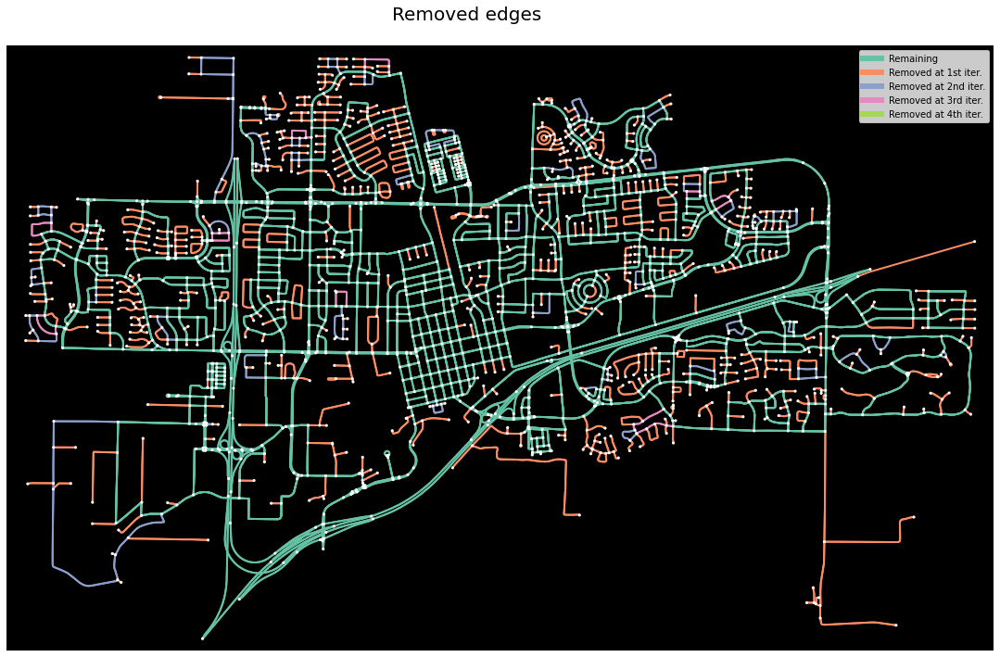

In [37]:
# Plot edge types on the map
removed_edge_dic = {}
nx.set_edge_attributes(G, 0, 'rm_iter')

for idx, removed_edge_list in enumerate(removed_edges):
    idx += 1
    for removed_edge in removed_edge_list:
        G.edges[removed_edge]['rm_iter'] = idx
           
# Plot a map that represents the type of each edge
ec = ox.plot.get_edge_colors_by_attr(G, "rm_iter", cmap='Set2', num_bins=5, start=0, stop=0.624, na_color='none')
rm_fig, rm_ax = plot_graph(G, figsize=(40, 12), node_color='white', node_size=10,
                                          edge_linewidth=2, edge_color=ec, show=False, close=False, bgcolor='black')

rm_fig.suptitle(t='Removed edges', y=0.93, size=20)
   
# Add legend
cmap = plt.cm.get_cmap('Set2')

line_remained, = plt.plot([0, 0, 0], label='Remaining', c=cmap(0), linewidth = 6)
line_1st, = plt.plot([0, 0, 0], label='Removed at 1st iter.', c=cmap(0.125), linewidth = 6)
line_2nd, = plt.plot([0, 0, 0], label='Removed at 2nd iter.', c=cmap(0.250), linewidth = 6)
line_3rd, = plt.plot([0, 0, 0], label='Removed at 3rd iter.', c=cmap(0.375), linewidth = 6)
line_4th, = plt.plot([0, 0, 0], label='Removed at 4th iter.', c=cmap(0.500), linewidth = 6)

plt.legend([line_remained, line_1st,
            line_2nd, line_3rd, line_4th],
           ['Remaining', 'Removed at 1st iter.',
            'Removed at 2nd iter.', 'Removed at 3rd iter.', 'Removed at 4th iter.'],
            prop={'size': 10})

plt.show()
plt.close('all')

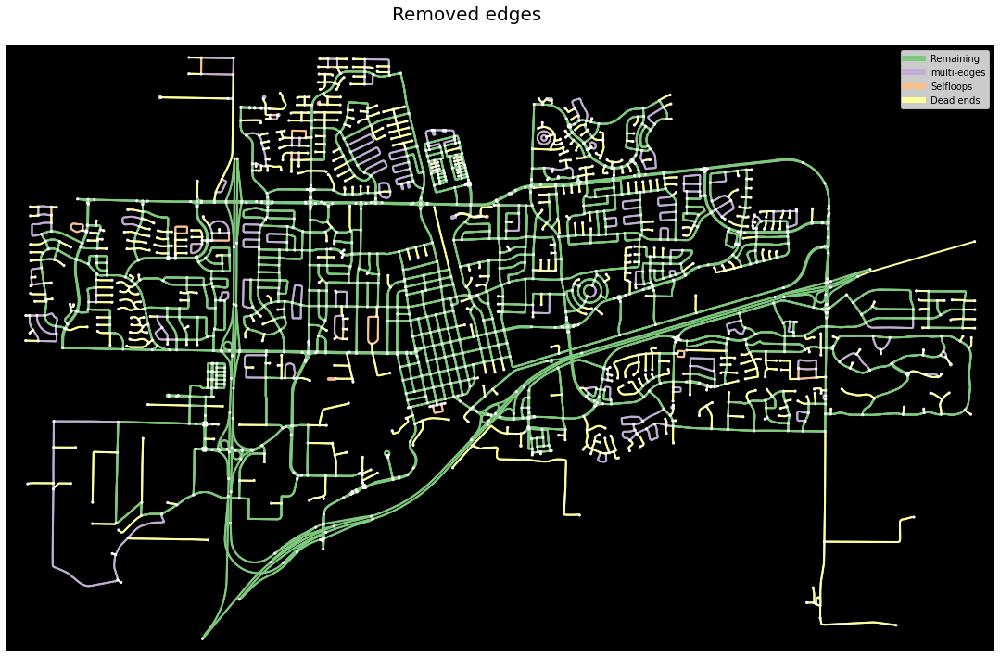

In [41]:
# Plot edge types on the map

nx.set_edge_attributes(G, 0, 'rm_cat')

for idx, removed_edge_list in enumerate(removed_cat):
    idx += 1
    for removed_edge in removed_edge_list:
        G.edges[removed_edge]['rm_cat'] = idx
               
# Plot a map that represents the type of each edge
ec = ox.plot.get_edge_colors_by_attr(G, "rm_cat", cmap='Accent', num_bins=4, start=0, stop=0.49, na_color='none')
rm_fig, rm_ax = plot_graph(G, figsize=(40, 12), node_color='white', node_size=10,
                                          edge_linewidth=2, edge_color=ec, show=False, close=False, bgcolor='black')

rm_fig.suptitle(t='Removed edges', y=0.93, size=20)
   
# Add legend
cmap = plt.cm.get_cmap('Accent')

line_remained, = plt.plot([0, 0, 0], label='Remaining', c=cmap(0), linewidth = 6)
line_1st, = plt.plot([0, 0, 0], label='multi-edges', c=cmap(0.125), linewidth = 6)
line_2nd, = plt.plot([0, 0, 0], label='selfloops', c=cmap(0.250), linewidth = 6)
line_3rd, = plt.plot([0, 0, 0], label='dead_ends', c=cmap(0.375), linewidth = 6)

plt.legend([line_remained, line_1st,
            line_2nd, line_3rd],
           ['Remaining', 'multi-edges',
            'Selfloops', 'Dead ends'],
            prop={'size': 10})

plt.show()
plt.close('all')

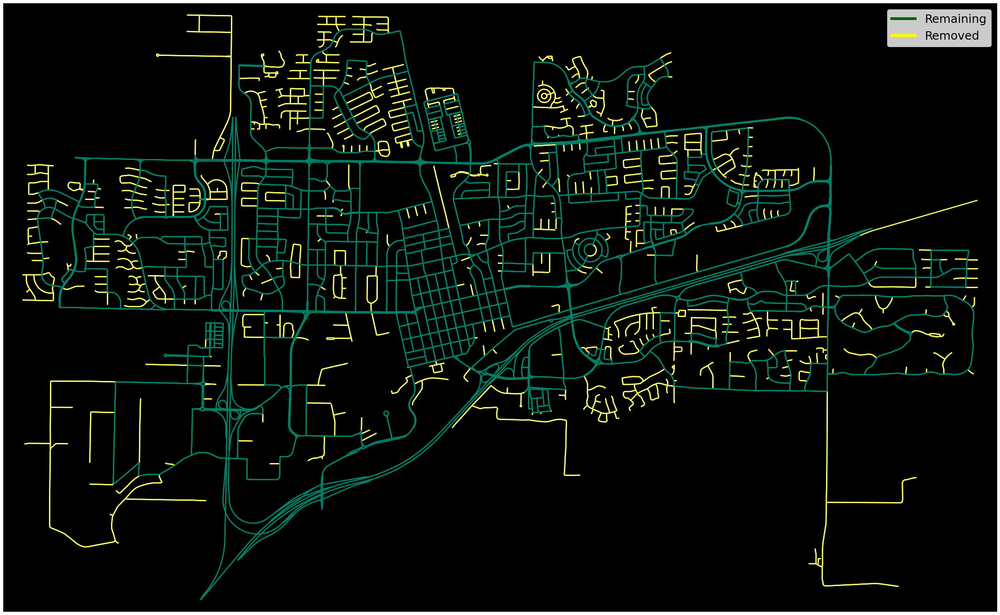

In [38]:
# Plot edge types on the map
nx.set_edge_attributes(G, 0, 'rm_iter')

for idx, removed_edge_list in enumerate(removed_edges):
    for removed_edge in removed_edge_list:
        G.edges[removed_edge]['rm_iter'] = 1

# Get edge colors based on removal
ec = ox.plot.get_edge_colors_by_attr(G, 'rm_iter', num_bins=None, cmap='summer',
                                     start=0, stop=1, na_color='none', equal_size=False)

fig, ax = plot_graph(G, figsize=(40,24), node_color='deepskyblue', node_size=0,
                        edge_linewidth=2.5, edge_color=ec, show=False, close=False, bgcolor='k')

line_up, = plt.plot([10, 20, 30], label='One', c='darkgreen', linewidth = 6)
line_down, = plt.plot([30, 20, 10], label='Two', c='yellow', linewidth = 6)
plt.legend([line_up, line_down], ['Remaining', 'Removed'], prop={'size': 25})

plt.show()

In [173]:
removed_count = {}

road_priority = {'motorway': 1,
                'motorway_link': 2,
                'primary': 3,
                'primary_link': 4,
                'secondary': 5,
                'secondary_link': 6,
                'tertiary': 7,
                'tertiary_link': 8,
                'residential': 9,
                'unclassified': 10}


for idx, removed_edge_list in enumerate(removed_edges):
    for removed_edge in removed_edge_list:
        road_type = G.edges[removed_edge]['highway']
        if type(road_type) == list:
            priorities = []
            for rt in road_type:
                priorities.append(road_priority[rt])
            priority = min(priorities)
            
            for pair in road_priority.items():
                if priority == pair[1]: road_type = pair[0]
                    
        if road_type in removed_count:
            removed_count[road_type] += 1
        else:
            removed_count[road_type] = 1
            
print(removed_count)

{'residential': 1784, 'unclassified': 12, 'motorway': 1, 'tertiary': 22}


In [194]:
# Set default speed of vehicles on each type of road
hwy_speeds = {'motorway': 110,
            'motorway_link': 60,
            'primary': 60,
            'primary_link': 50,
            'secondary': 50,
            'secondary_link': 40,
            'tertiary': 40,
            'tertiary_link': 40,
            'residential': 40,
            'unclassified':40}

# Plug in to the graph. 'speed_kph' attribute is added to each edge and set to the default speed.
G = ox.add_edge_speeds(G, hwy_speeds)

# Add 'travel_time' property to each node, which is 'length' divided by 'speed_kph'
G = ox.add_edge_travel_times(G)


for edge in G.edges:
    edge_type = G.edges[edge]['highway']
    edge_len = G.edges[edge]['length']
    signal_delay = 0

    if edge_type == 'primary':
        if edge_len > 15 : signal_delay = 10

    elif edge_type == 'secondary':
        if edge_len > 15 : signal_delay = 10

    elif edge_type == 'tertiary':
        if edge_len > 15 : signal_delay = 6

    elif edge_type == 'residential':
        if edge_len > 15 : signal_delay = 4
            
    G.edges[edge]['travel_time'] += signal_delay

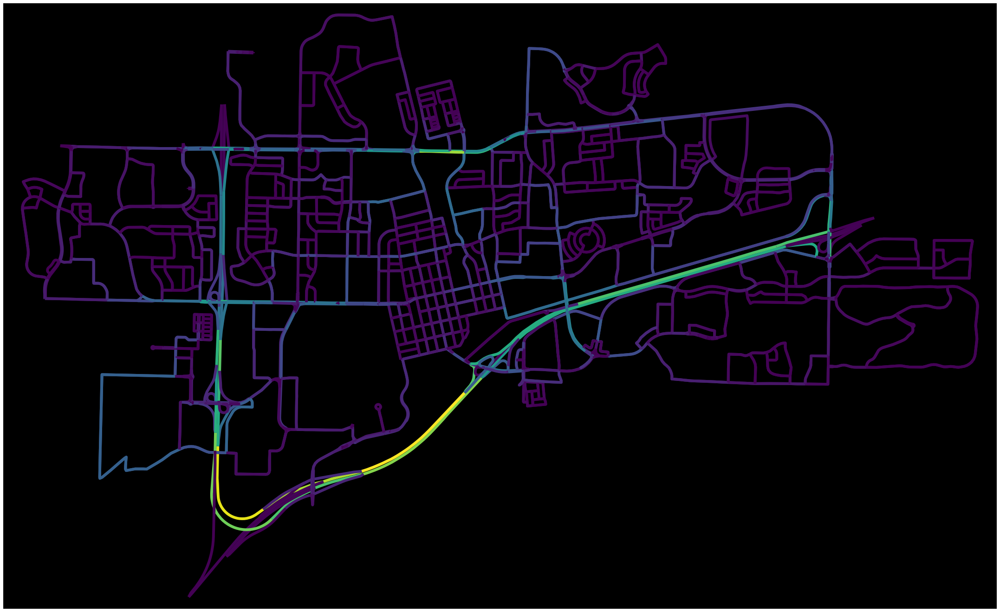

In [200]:
# Get betweenness centrality of each edge
G2 = nx.DiGraph(G1)
bet_cent=nx.edge_betweenness_centrality(G2, weight='travel_time')

# Add betweenness centrality to edge attribute
formatted_bet_cent = {}
for (u, v), value in bet_cent.items():
    formatted_bet_cent[(u, v, 0)] = value
       
nx.set_edge_attributes(G1, formatted_bet_cent, "bet_cent")

bet_edge_col = ox.plot.get_edge_colors_by_attr(G1, "bet_cent", cmap='viridis', start=0, stop=1, na_color='none')
bet_fig, bet_ax = ox.plot_graph(G1, figsize=(40,24), node_color='b', node_size=0,
                                edge_linewidth=6, edge_color=bet_edge_col, show=False, close=False, bgcolor='black')

plt.show()
plt.close('all')

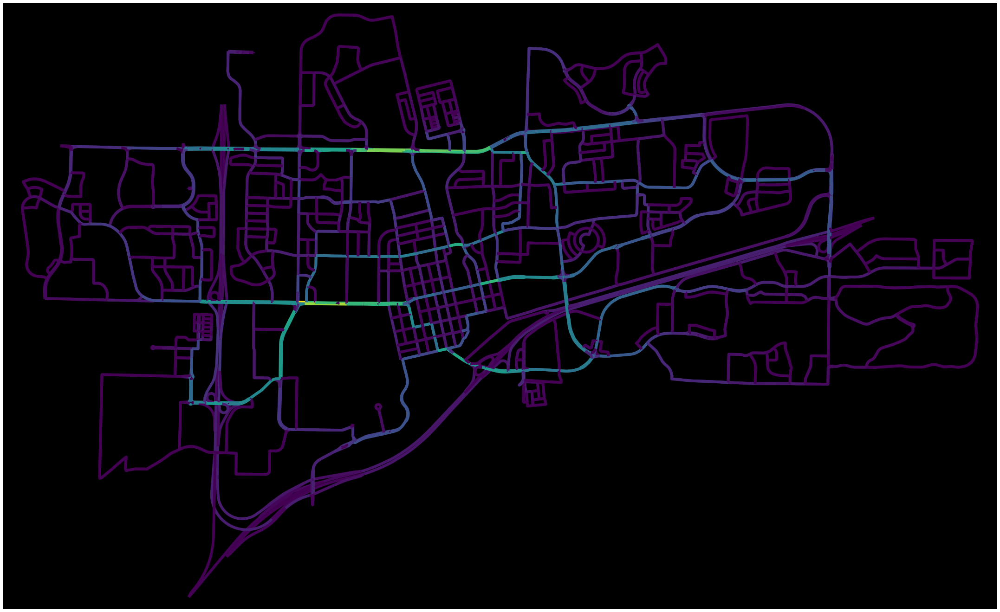

In [201]:
# Get betweenness centrality of each edge
G2 = nx.DiGraph(G1)
bet_cent=nx.edge_betweenness_centrality(G2, weight='length')

# Add betweenness centrality to edge attribute
formatted_bet_cent = {}
for (u, v), value in bet_cent.items():
    formatted_bet_cent[(u, v, 0)] = value
       
nx.set_edge_attributes(G1, formatted_bet_cent, "bet_cent")

bet_edge_col = ox.plot.get_edge_colors_by_attr(G1, "bet_cent", cmap='viridis', start=0, stop=1, na_color='none')
bet_fig, bet_ax = ox.plot_graph(G1, figsize=(40,24), node_color='b', node_size=0,
                                edge_linewidth=6, edge_color=bet_edge_col, show=False, close=False, bgcolor='black')

plt.show()
plt.close('all')

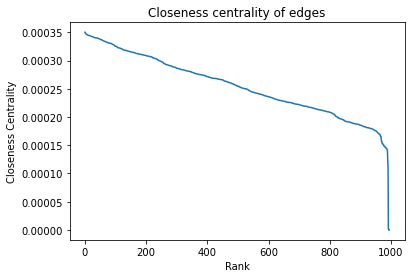

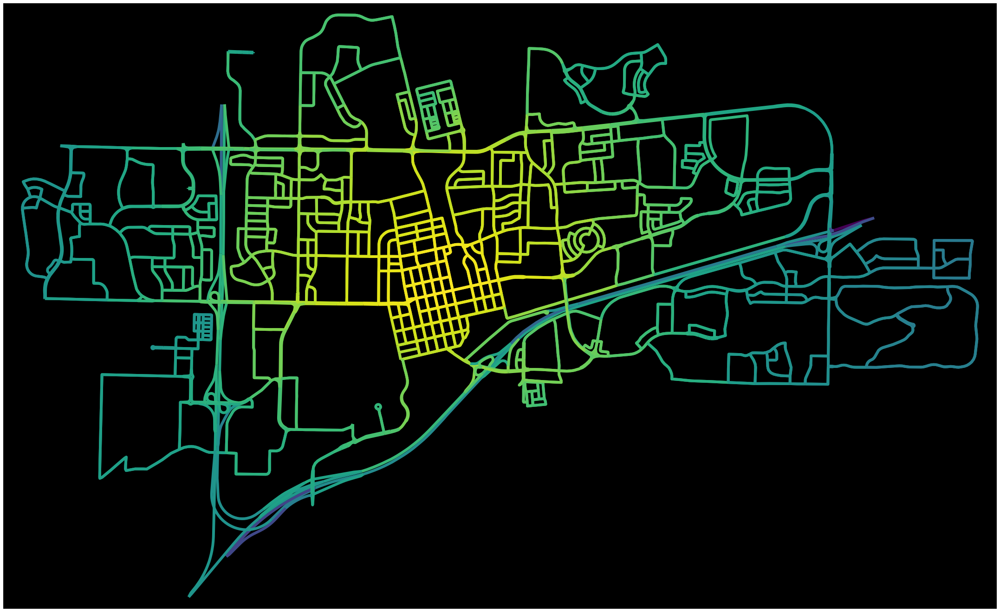

In [202]:
# closeness centrality weighted by length

# Compute closeness centrality of each node
cls_cent = nx.closeness_centrality(G1, u=None, distance='length', wf_improved=True)   
sorted_cls_cent = sorted(cls_cent.items(), reverse=True, key = lambda kv:(kv[1], kv[0]))    

cls_cent_values = []
for item in sorted_cls_cent:
    cls_cent_values.append(item[1])
    
plt.title('Closeness centrality of edges')
plt.xlabel('Rank') 
plt.ylabel('Closeness Centrality')
plt.plot(cls_cent_values)
plt.show()
plt.close('all')

# Add closeness centrality to node attribute
nx.set_node_attributes(G1, cls_cent, "cls_cent")

for u,v,k,d in G1.edges(keys=True, data=True):
    u_sc = G1.nodes[u]['cls_cent']
    v_sc = G1.nodes[v]['cls_cent']
    edge_sc = (u_sc + v_sc) / 2
    d['cls_cent'] = edge_sc
    
# Plot a map that represents the eigenvector centrality of each node
ec = ox.plot.get_edge_colors_by_attr(G1, "cls_cent", cmap='viridis', start=0, stop=1, na_color='none')
cls_fig, cls_ax = ox.plot_graph(G1, figsize=(40,24), node_color='b', node_size=0,
                                edge_linewidth=6, edge_color=ec, show=False, close=False, bgcolor='black')

plt.show()
plt.close('all')

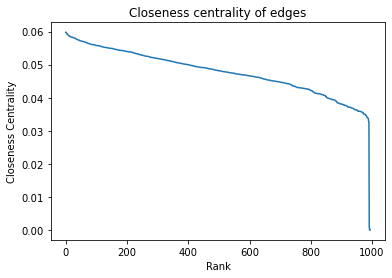

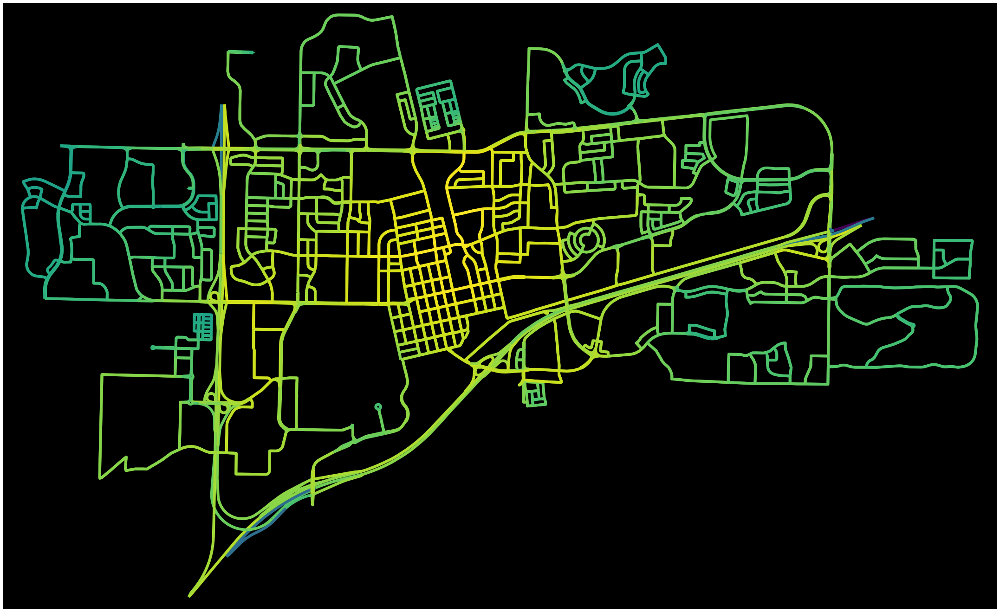

In [203]:
# closeness centrality weighted by travel time

# Compute closeness centrality of each node
cls_cent = nx.closeness_centrality(G1, u=None, distance='travel_time', wf_improved=True)   
sorted_cls_cent = sorted(cls_cent.items(), reverse=True, key = lambda kv:(kv[1], kv[0]))    

cls_cent_values = []
for item in sorted_cls_cent:
    cls_cent_values.append(item[1])
    
plt.title('Closeness centrality of edges')
plt.xlabel('Rank') 
plt.ylabel('Closeness Centrality')
plt.plot(cls_cent_values)
plt.show()
plt.close('all')

# Add closeness centrality to node attribute
nx.set_node_attributes(G1, cls_cent, "cls_cent")

for u,v,k,d in G1.edges(keys=True, data=True):
    u_sc = G1.nodes[u]['cls_cent']
    v_sc = G1.nodes[v]['cls_cent']
    edge_sc = (u_sc + v_sc) / 2
    d['cls_cent'] = edge_sc
    
# Plot a map that represents the eigenvector centrality of each node
ec = ox.plot.get_edge_colors_by_attr(G1, "cls_cent", cmap='viridis', start=0, stop=1, na_color='none')
cls_fig, cls_ax = ox.plot_graph(G1, figsize=(40,24), node_color='b', node_size=0,
                                edge_linewidth=6, edge_color=ec, show=False, close=False, bgcolor='black')

plt.show()
plt.close('all')

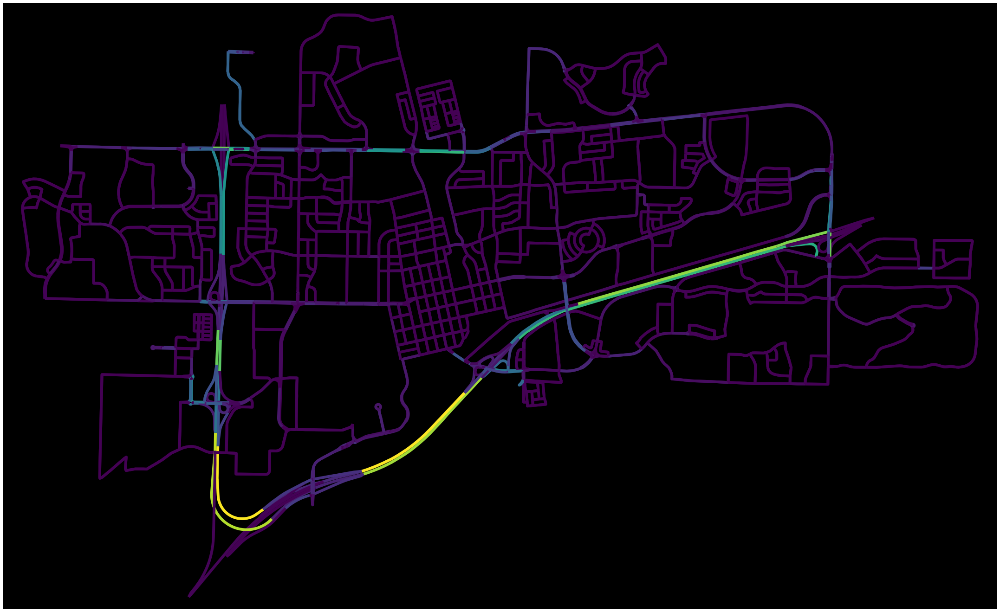

In [198]:
# Information centrality weighted by travel time
import pickle

# create a binary pickle file 
rf = open("ic_time.pkl","rb")
ic = pickle.load(rf)
rf.close()

nx.set_edge_attributes(G1, ic, 'info_cent')

ec = ox.plot.get_edge_colors_by_attr(G1, "info_cent", cmap='viridis', start=0, stop=1, na_color='none')
ic_fig, ic_ax = ox.plot_graph(G1, figsize=(40,24), node_size=0,
                                edge_linewidth=6, edge_color=ec, show=False, close=False, bgcolor='black')

plt.show()
plt.close('all')

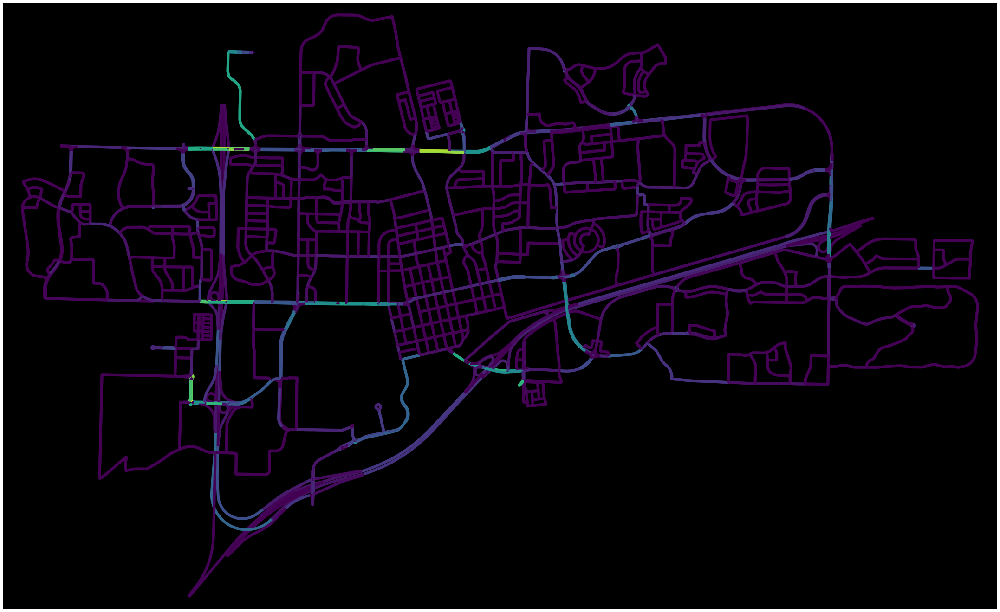

In [199]:
# Information centrality weighted by edge length

# create a binary pickle file 
rf = open("ic_len.pkl","rb")
ic = pickle.load(rf)
rf.close()

nx.set_edge_attributes(G1, ic, 'info_cent')

ec = ox.plot.get_edge_colors_by_attr(G1, "info_cent", cmap='viridis', start=0, stop=1, na_color='none')
ic_fig, ic_ax = ox.plot_graph(G1, figsize=(40,24), node_size=0,
                                edge_linewidth=6, edge_color=ec, show=False, close=False, bgcolor='black')

plt.show()
plt.close('all')

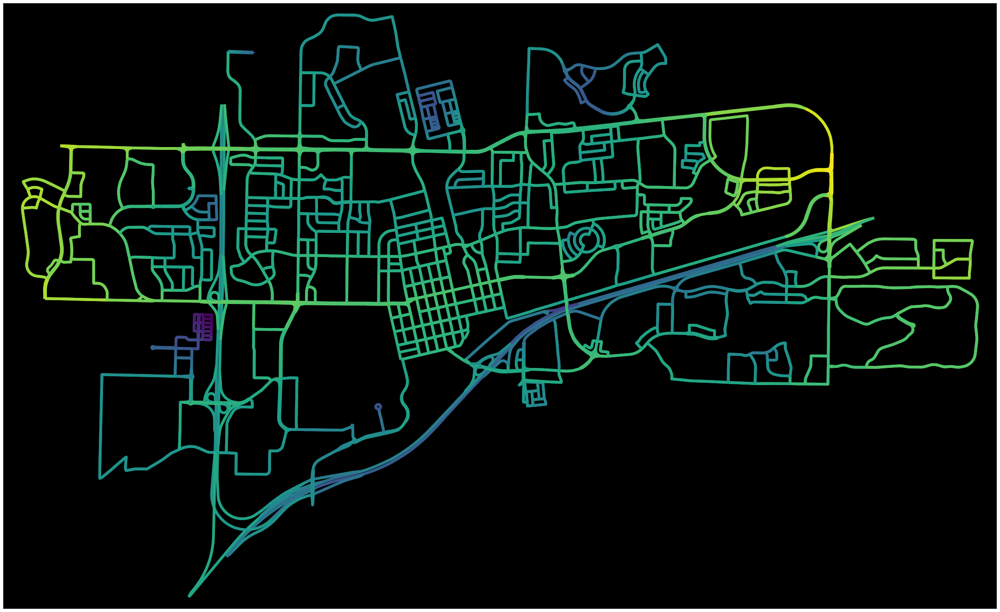

In [206]:
# Straightness centrality weighted by edge length

# create a binary pickle file 
rf = open("sc_len.pkl","rb")
sc = pickle.load(rf)
rf.close()

nx.set_node_attributes(G1, sc, 'str_cent')

for u,v,k,d in G1.edges(keys=True, data=True):
    u_sc = G1.nodes[u]['str_cent']
    v_sc = G1.nodes[v]['str_cent']
    edge_sc = (u_sc + v_sc) / 2
    d['str_cent'] = edge_sc

ec = ox.plot.get_edge_colors_by_attr(G1, "str_cent", cmap='viridis', start=0, stop=1, na_color='none')
ic_fig, ic_ax = ox.plot_graph(G1, figsize=(40,24), node_size=0,
                                edge_linewidth=6, edge_color=ec, show=False, close=False, bgcolor='black')

plt.show()
plt.close('all')

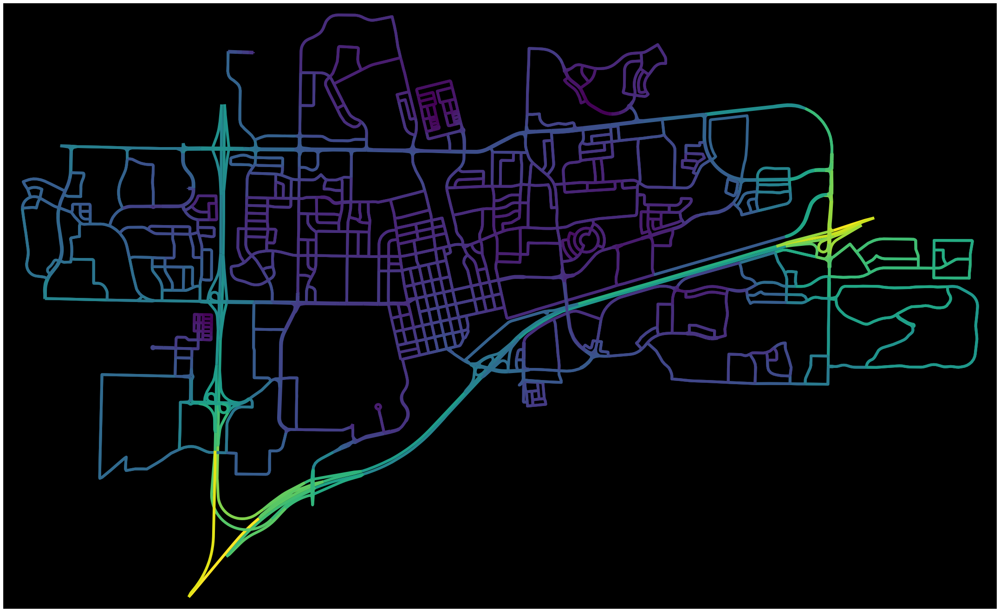

In [207]:
# Straightness centrality weighted by travel time

# create a binary pickle file 
rf = open("sc_time.pkl","rb")
sc = pickle.load(rf)
rf.close()

nx.set_node_attributes(G1, sc, 'str_cent')

for u,v,k,d in G1.edges(keys=True, data=True):
    u_sc = G1.nodes[u]['str_cent']
    v_sc = G1.nodes[v]['str_cent']
    edge_sc = (u_sc + v_sc) / 2
    d['str_cent'] = edge_sc

ec = ox.plot.get_edge_colors_by_attr(G1, "str_cent", cmap='viridis', start=0, stop=1, na_color='none')
ic_fig, ic_ax = ox.plot_graph(G1, figsize=(40,24), node_size=0,
                                edge_linewidth=6, edge_color=ec, show=False, close=False, bgcolor='black')

plt.show()
plt.close('all')

1    2256
2     221
3      31
4      30
5       4
6       1
Name: lanes, dtype: int64


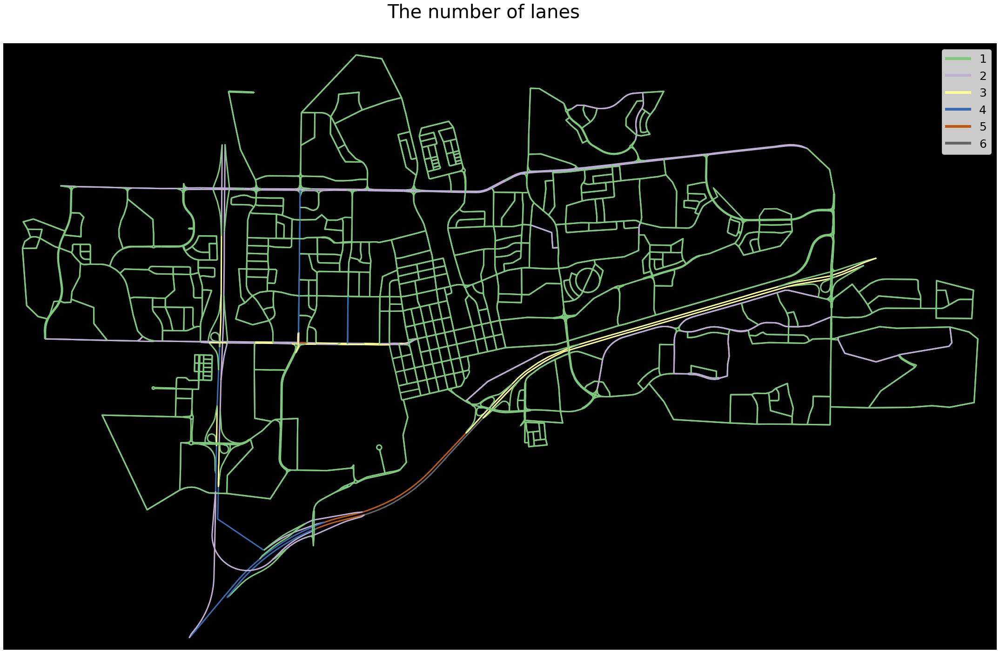

In [414]:
G = simple_G
# Visualize the number of lanes of each edge
double_lane = ['East Covell Boulevard', 'West Covell Boulevard',
              'Covell Boulevard', 'Russell Boulevard',
               'East Covell Boulevard;West Covell Boulevard']
triple_lane = []
lane_dic = {}

for edge in G.edges:
  # Get the number of lane
  edge_data = G.get_edge_data(edge[0], edge[1], edge[2])
  num_lane = edge_data.get('lanes')

  if isinstance(num_lane, list):
    num_lane = int(max(num_lane))
  elif isinstance(num_lane, str):
    num_lane = int(num_lane)
  elif num_lane == None: # if num_lane is None
    num_lane = 1
    
  
  # Find the edges that have designated number of lanes
  road_name = edge_data.get('name')
  if isinstance(road_name, list):
      road_name = road_name[0]
  
  tem_lane_num = 0
  if road_name in double_lane :
      tem_lane_num = 2
  elif road_name in triple_lane :
      tem_lane_num = 3
  else : tem_lane_num = 1

  final_num = max(num_lane, tem_lane_num)
  lane_dic[edge] = final_num

nx.set_edge_attributes(G, lane_dic, 'lanes')

# Get edge colors based on way-attribute

# Add a legend
cmap = plt.cm.get_cmap('Accent', 6)

lane_col = ox.plot.get_edge_colors_by_attr(G, 'lanes', num_bins=6, cmap=cmap, start=0, stop=1, na_color='none')
lane_fig, lane_ax = ox.plot_graph(G, figsize=(40,24), node_color='b', node_size=0,
                                edge_linewidth=3, edge_color=lane_col, show=False, close=False, bgcolor='black')

lane_fig.suptitle(t='The number of lanes', y=0.93, size=40)

# Add legend
line_1, = plt.plot([10, 20, 30], label='1', c=cmap(0), linewidth = 6)
line_2, = plt.plot([10, 20, 30], label='2', c=cmap(1), linewidth = 6)
line_3, = plt.plot([30, 20, 10], label='3', c=cmap(2), linewidth = 6)
line_4, = plt.plot([30, 20, 10], label='4', c=cmap(3), linewidth = 6)
line_5, = plt.plot([30, 20, 10], label='5', c=cmap(4), linewidth = 6)
line_6, = plt.plot([30, 20, 10], label='6', c=cmap(6), linewidth = 6)

plt.legend([line_1, line_2, line_3, line_4, line_5, line_6], ['1', '2', '3', '4', '5', '6'], prop={'size': 25})

print(ox.graph_to_gdfs(G, nodes=False)['lanes'].value_counts())

plt.show()
plt.close('all')

residential                    1275
tertiary                        669
secondary                       324
primary                          84
motorway_link                    56
secondary_link                   35
motorway                         32
primary_link                     28
unclassified                     16
tertiary_link                    11
[residential, tertiary]           8
[residential, unclassified]       2
[secondary, tertiary]             2
[motorway_link, motorway]         1
Name: highway, dtype: int64


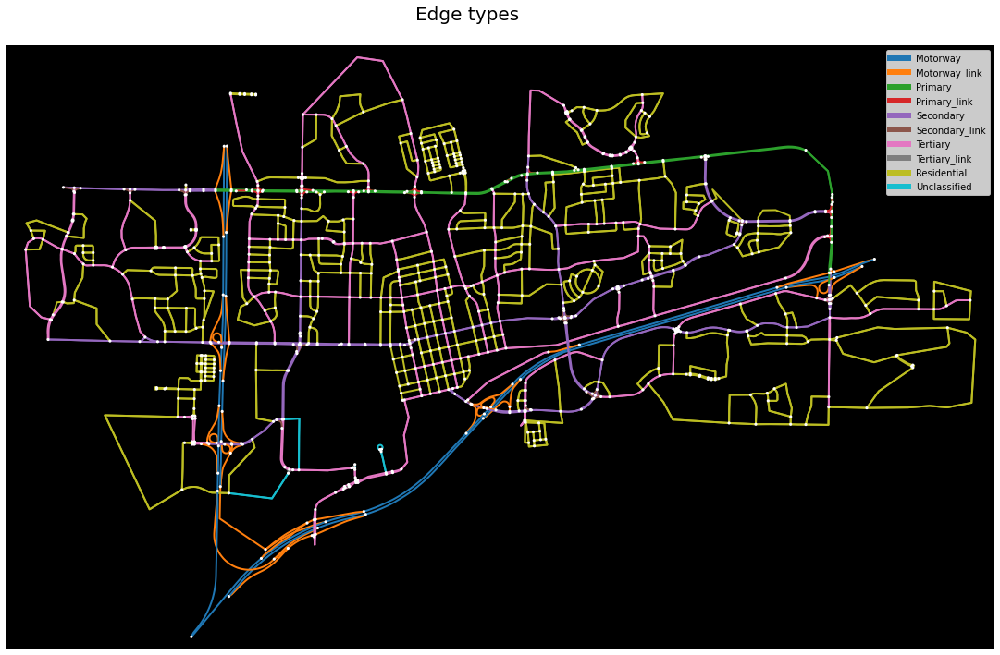

In [419]:
# Plot edge types on the map
edge_type_dic = {}
etype_val = {'motorway':0, 'motorway_link':1, 'primary':2, 'primary_link':3,
               'secondary':4, 'secondary_link':5, 'tertiary':6, 'tertiary_link':7,
               'residential':8, 'unclassified':9}

for (u,v,k) in G.edges:
    etype = G.edges[u,v,k]['highway']
    
    if type(etype) == list:
        etype = sorted(etype, reverse=True, key = lambda d: etype_val[d])
        etype = etype[0]
        
    edge_type_dic[(u,v,k)] = etype_val[etype]
    
# Add edge type as a numerical value to edge attribute
nx.set_edge_attributes(G, edge_type_dic, "edge_type")

# Plot a map that represents the type of each edge
ec = ox.plot.get_edge_colors_by_attr(G, "edge_type", cmap='tab10', num_bins=10, start=0, stop=1, na_color='none')
edge_type_fig, edge_type_ax = ox.plot_graph(G, figsize=(40, 12), node_color='white', node_size=10,
                                          edge_linewidth=2, edge_color=ec, show=False, close=False, bgcolor='black')

edge_type_fig.suptitle(t='Edge types', y=0.93, size=20)
   
# Add legend
cmap = plt.cm.get_cmap('tab10')

line_motor, = plt.plot([0, 0, 0], label='Motorway', c=cmap(0), linewidth = 6)
line_motor_link, = plt.plot([0, 0, 0], label='Motorway_link', c=cmap(1), linewidth = 6)
line_primary, = plt.plot([0, 0, 0], label='Primary', c=cmap(2), linewidth = 6)
line_primary_link, = plt.plot([0, 0, 0], label='Primary_link', c=cmap(3), linewidth = 6)
line_secondary, = plt.plot([0, 0, 0], label='Secondary', c=cmap(4), linewidth = 6)
line_secondary_link, = plt.plot([0, 0, 0], label='Secondary_link', c=cmap(5), linewidth = 6)
line_tertiary, = plt.plot([0, 0, 0], label='Tertiary', c=cmap(6), linewidth = 6)
line_tertiary_link, = plt.plot([0, 0, 0], label='Tertiary_link', c=cmap(7), linewidth = 6)
line_residential, = plt.plot([0, 0, 0], label='residential', c=cmap(8), linewidth = 6)
line_unclassified, = plt.plot([0, 0, 0], label='unclassified', c=cmap(9), linewidth = 6)

plt.legend([line_motor, line_motor_link,
            line_primary, line_primary_link,
            line_secondary, line_secondary_link,
            line_tertiary, line_tertiary_link,
            line_residential, line_unclassified],
           ['Motorway', 'Motorway_link',
            'Primary', 'Primary_link',
            'Secondary', 'Secondary_link',
            'Tertiary', 'Tertiary_link',
            'Residential', 'Unclassified'], prop={'size': 10})

print(ox.graph_to_gdfs(G, nodes=False)['highway'].value_counts())
plt.show()
plt.close('all')